In [1]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
import tifffile as tiff
from helpers import *
from preprocessing import *
from models import *

In [2]:
dataset_dir = './satellite images/data'

# Prepare Data

In [3]:
train_paths = json.load(open('train_paths.json'))
val_paths = json.load(open('val_paths.json'))
test_paths = json.load(open('test_paths.json'))

train_images_paths = [path[0] for path in train_paths]
mean, std = get_mean_and_std(images_dir=f'{dataset_dir}/images',images_paths=train_images_paths)

In [4]:
from torch.utils.data import DataLoader

train_dataset = WaterSegDataset(
    images_dir=f'{dataset_dir}/images', 
    masks_dir=f'{dataset_dir}/labels', 
    zipped_paths=train_paths,
    type='train')

val_dataset = WaterSegDataset(
    images_dir=f'{dataset_dir}/images', 
    masks_dir=f'{dataset_dir}/labels', 
    zipped_paths=val_paths,
    type='val')

test_dataset = WaterSegDataset(
    images_dir=f'{dataset_dir}/images', 
    masks_dir=f'{dataset_dir}/labels', 
    zipped_paths=test_paths,
    type='test')

batch_size = 16
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Model

## DeepLabv3+ with resnet50

In [5]:
deeplabv3_resnet50_model = DeepLabV3Finetuned(in_channels=12, num_classes=1, pretrained=True, resnet_type='resnet50')

c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
optimizer = torch.optim.Adam(deeplabv3_resnet50_model.parameters(), lr=0.001)
dice_loss_kwargs = {
    'smooth': 1e-6,
}
focal_loss_kwargs = {
    'alpha': [0.25, 0.75],
    'gamma': 2,
    'reduction': 'mean',
}
num_epochs = 30
criterion = CombinedLoss(dice_loss_weight=0.5, focal_loss_weight=0.5, dice_loss_kwargs=dice_loss_kwargs,focal_loss_kwargs=focal_loss_kwargs)


In [7]:
history = train(
    model=deeplabv3_resnet50_model,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    device=device,
    models_weights_path='./models_weights/deeplab_finetuned/deeplabv3_resnet50.pth'
)

Epoch 1/30
----------


100%|██████████| 17/17 [00:03<00:00,  4.38it/s]


Train Loss: 0.3255, Accuracy: 67.55%, Precision: 0.7955, Recall: 0.6755, F1 Score: 0.7029, Dice Coefficient: 0.5152, IOU: 0.3470


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 0.7456, Accuracy: 65.04%, Precision: 0.7664, Recall: 0.6504, F1 Score: 0.6488, Dice Coefficient: 0.6560, IOU: 0.4881
--------------------------------------------------
Best model saved with Val Loss: 0.7456
Epoch 2/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.12it/s]


Train Loss: 0.2539, Accuracy: 83.61%, Precision: 0.8593, Recall: 0.8361, F1 Score: 0.8435, Dice Coefficient: 0.6756, IOU: 0.5101


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 1.3238, Accuracy: 78.23%, Precision: 0.7869, Recall: 0.7823, F1 Score: 0.7690, Dice Coefficient: 0.6369, IOU: 0.4672
--------------------------------------------------
Epoch 3/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.19it/s]


Train Loss: 0.2270, Accuracy: 84.70%, Precision: 0.8711, Recall: 0.8470, F1 Score: 0.8541, Dice Coefficient: 0.7035, IOU: 0.5427


100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Val Loss: 0.4202, Accuracy: 84.39%, Precision: 0.8532, Recall: 0.8439, F1 Score: 0.8459, Dice Coefficient: 0.8007, IOU: 0.6677
--------------------------------------------------
Best model saved with Val Loss: 0.4202
Epoch 4/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.15it/s]


Train Loss: 0.2071, Accuracy: 86.89%, Precision: 0.8778, Recall: 0.8689, F1 Score: 0.8721, Dice Coefficient: 0.7238, IOU: 0.5672


100%|██████████| 2/2 [00:02<00:00,  1.03s/it]


Val Loss: 0.2449, Accuracy: 89.82%, Precision: 0.8980, Recall: 0.8982, F1 Score: 0.8971, Dice Coefficient: 0.8538, IOU: 0.7449
--------------------------------------------------
Best model saved with Val Loss: 0.2449
Epoch 5/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.17it/s]


Train Loss: 0.2012, Accuracy: 86.82%, Precision: 0.8821, Recall: 0.8682, F1 Score: 0.8727, Dice Coefficient: 0.7294, IOU: 0.5741


100%|██████████| 2/2 [00:02<00:00,  1.03s/it]


Val Loss: 0.1925, Accuracy: 89.20%, Precision: 0.8917, Recall: 0.8920, F1 Score: 0.8918, Dice Coefficient: 0.8506, IOU: 0.7400
--------------------------------------------------
Best model saved with Val Loss: 0.1925
Epoch 6/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.34it/s]


Train Loss: 0.1857, Accuracy: 89.08%, Precision: 0.8931, Recall: 0.8908, F1 Score: 0.8918, Dice Coefficient: 0.7588, IOU: 0.6113


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1927, Accuracy: 89.14%, Precision: 0.8910, Recall: 0.8914, F1 Score: 0.8902, Dice Coefficient: 0.8438, IOU: 0.7298
--------------------------------------------------
Epoch 7/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.16it/s]


Train Loss: 0.1752, Accuracy: 88.92%, Precision: 0.8947, Recall: 0.8892, F1 Score: 0.8912, Dice Coefficient: 0.7628, IOU: 0.6165


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 0.1474, Accuracy: 88.61%, Precision: 0.8865, Recall: 0.8861, F1 Score: 0.8863, Dice Coefficient: 0.8446, IOU: 0.7310
--------------------------------------------------
Best model saved with Val Loss: 0.1474
Epoch 8/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.25it/s]


Train Loss: 0.1754, Accuracy: 89.93%, Precision: 0.9022, Recall: 0.8993, F1 Score: 0.9005, Dice Coefficient: 0.7790, IOU: 0.6380


100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Val Loss: 0.1860, Accuracy: 89.71%, Precision: 0.8977, Recall: 0.8971, F1 Score: 0.8956, Dice Coefficient: 0.8499, IOU: 0.7390
--------------------------------------------------
Epoch 9/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.37it/s]


Train Loss: 0.2035, Accuracy: 89.03%, Precision: 0.8904, Recall: 0.8903, F1 Score: 0.8903, Dice Coefficient: 0.7522, IOU: 0.6028


100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Val Loss: 0.1340, Accuracy: 86.50%, Precision: 0.8773, Recall: 0.8650, F1 Score: 0.8670, Dice Coefficient: 0.8306, IOU: 0.7103
--------------------------------------------------
Best model saved with Val Loss: 0.1340
Epoch 10/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.33it/s]


Train Loss: 0.2126, Accuracy: 88.73%, Precision: 0.8917, Recall: 0.8873, F1 Score: 0.8891, Dice Coefficient: 0.7560, IOU: 0.6077


100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Val Loss: 0.2111, Accuracy: 82.47%, Precision: 0.8228, Recall: 0.8247, F1 Score: 0.8225, Dice Coefficient: 0.7463, IOU: 0.5953
--------------------------------------------------
Epoch 11/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.17it/s]


Train Loss: 0.1959, Accuracy: 89.54%, Precision: 0.8957, Recall: 0.8954, F1 Score: 0.8955, Dice Coefficient: 0.7628, IOU: 0.6165


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 0.1428, Accuracy: 90.03%, Precision: 0.8998, Recall: 0.9003, F1 Score: 0.8999, Dice Coefficient: 0.8608, IOU: 0.7557
--------------------------------------------------
Epoch 12/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.15it/s]


Train Loss: 0.1599, Accuracy: 90.66%, Precision: 0.9092, Recall: 0.9066, F1 Score: 0.9076, Dice Coefficient: 0.7938, IOU: 0.6581


100%|██████████| 2/2 [00:02<00:00,  1.11s/it]


Val Loss: 0.1343, Accuracy: 90.54%, Precision: 0.9052, Recall: 0.9054, F1 Score: 0.9046, Dice Coefficient: 0.8650, IOU: 0.7622
--------------------------------------------------
Epoch 13/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.26it/s]


Train Loss: 0.1750, Accuracy: 89.73%, Precision: 0.9019, Recall: 0.8973, F1 Score: 0.8991, Dice Coefficient: 0.7784, IOU: 0.6372


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.1079, Accuracy: 88.60%, Precision: 0.8952, Recall: 0.8860, F1 Score: 0.8875, Dice Coefficient: 0.8549, IOU: 0.7466
--------------------------------------------------
Best model saved with Val Loss: 0.1079
Epoch 14/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.04it/s]


Train Loss: 0.1727, Accuracy: 90.02%, Precision: 0.9037, Recall: 0.9002, F1 Score: 0.9016, Dice Coefficient: 0.7807, IOU: 0.6403


100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Val Loss: 0.1933, Accuracy: 81.94%, Precision: 0.8350, Recall: 0.8194, F1 Score: 0.8222, Dice Coefficient: 0.7757, IOU: 0.6336
--------------------------------------------------
Epoch 15/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.35it/s]


Train Loss: 0.1940, Accuracy: 90.27%, Precision: 0.9029, Recall: 0.9027, F1 Score: 0.9028, Dice Coefficient: 0.7806, IOU: 0.6402


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.1099, Accuracy: 90.39%, Precision: 0.9055, Recall: 0.9039, F1 Score: 0.9044, Dice Coefficient: 0.8711, IOU: 0.7716
--------------------------------------------------
Epoch 16/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.17it/s]


Train Loss: 0.1610, Accuracy: 90.94%, Precision: 0.9124, Recall: 0.9094, F1 Score: 0.9106, Dice Coefficient: 0.8008, IOU: 0.6677


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.1374, Accuracy: 90.51%, Precision: 0.9046, Recall: 0.9051, F1 Score: 0.9045, Dice Coefficient: 0.8661, IOU: 0.7638
--------------------------------------------------
Epoch 17/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.22it/s]


Train Loss: 0.1557, Accuracy: 90.64%, Precision: 0.9111, Recall: 0.9064, F1 Score: 0.9081, Dice Coefficient: 0.7989, IOU: 0.6652


100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


Val Loss: 0.1182, Accuracy: 91.34%, Precision: 0.9131, Recall: 0.9134, F1 Score: 0.9130, Dice Coefficient: 0.8780, IOU: 0.7826
--------------------------------------------------
Epoch 18/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.66it/s]


Train Loss: 0.1599, Accuracy: 90.28%, Precision: 0.9088, Recall: 0.9028, F1 Score: 0.9049, Dice Coefficient: 0.7936, IOU: 0.6579


100%|██████████| 2/2 [00:02<00:00,  1.09s/it]


Val Loss: 0.1004, Accuracy: 91.40%, Precision: 0.9146, Recall: 0.9140, F1 Score: 0.9142, Dice Coefficient: 0.8832, IOU: 0.7908
--------------------------------------------------
Best model saved with Val Loss: 0.1004
Epoch 19/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.36it/s]


Train Loss: 0.1609, Accuracy: 90.96%, Precision: 0.9111, Recall: 0.9096, F1 Score: 0.9102, Dice Coefficient: 0.7987, IOU: 0.6649


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.1069, Accuracy: 90.20%, Precision: 0.9062, Recall: 0.9020, F1 Score: 0.9028, Dice Coefficient: 0.8716, IOU: 0.7725
--------------------------------------------------
Epoch 20/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.17it/s]


Train Loss: 0.1583, Accuracy: 90.97%, Precision: 0.9117, Recall: 0.9097, F1 Score: 0.9105, Dice Coefficient: 0.8013, IOU: 0.6684


100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Val Loss: 0.0944, Accuracy: 91.74%, Precision: 0.9181, Recall: 0.9174, F1 Score: 0.9177, Dice Coefficient: 0.8881, IOU: 0.7988
--------------------------------------------------
Best model saved with Val Loss: 0.0944
Epoch 21/30
----------


100%|██████████| 17/17 [00:03<00:00,  4.99it/s]


Train Loss: 0.1777, Accuracy: 91.17%, Precision: 0.9127, Recall: 0.9117, F1 Score: 0.9122, Dice Coefficient: 0.8025, IOU: 0.6702


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 0.1138, Accuracy: 89.83%, Precision: 0.9016, Recall: 0.8983, F1 Score: 0.8991, Dice Coefficient: 0.8658, IOU: 0.7633
--------------------------------------------------
Epoch 22/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.24it/s]


Train Loss: 0.1533, Accuracy: 91.47%, Precision: 0.9152, Recall: 0.9147, F1 Score: 0.9149, Dice Coefficient: 0.8100, IOU: 0.6806


100%|██████████| 2/2 [00:02<00:00,  1.04s/it]


Val Loss: 0.1038, Accuracy: 91.26%, Precision: 0.9139, Recall: 0.9126, F1 Score: 0.9130, Dice Coefficient: 0.8825, IOU: 0.7897
--------------------------------------------------
Epoch 23/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.12it/s]


Train Loss: 0.1581, Accuracy: 91.48%, Precision: 0.9158, Recall: 0.9148, F1 Score: 0.9153, Dice Coefficient: 0.8093, IOU: 0.6797


100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Val Loss: 0.0954, Accuracy: 91.72%, Precision: 0.9182, Recall: 0.9172, F1 Score: 0.9175, Dice Coefficient: 0.8883, IOU: 0.7991
--------------------------------------------------
Epoch 24/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.16it/s]


Train Loss: 0.1599, Accuracy: 91.30%, Precision: 0.9139, Recall: 0.9130, F1 Score: 0.9134, Dice Coefficient: 0.8054, IOU: 0.6742


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.1033, Accuracy: 90.76%, Precision: 0.9088, Recall: 0.9076, F1 Score: 0.9080, Dice Coefficient: 0.8756, IOU: 0.7788
--------------------------------------------------
Epoch 25/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.16it/s]


Train Loss: 0.1602, Accuracy: 90.64%, Precision: 0.9100, Recall: 0.9064, F1 Score: 0.9077, Dice Coefficient: 0.7968, IOU: 0.6622


100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Val Loss: 0.0937, Accuracy: 92.12%, Precision: 0.9218, Recall: 0.9212, F1 Score: 0.9214, Dice Coefficient: 0.8931, IOU: 0.8068
--------------------------------------------------
Best model saved with Val Loss: 0.0937
Epoch 26/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.13it/s]


Train Loss: 0.1818, Accuracy: 90.50%, Precision: 0.9095, Recall: 0.9050, F1 Score: 0.9067, Dice Coefficient: 0.7950, IOU: 0.6598


100%|██████████| 2/2 [00:02<00:00,  1.13s/it]


Val Loss: 0.0874, Accuracy: 92.07%, Precision: 0.9218, Recall: 0.9207, F1 Score: 0.9210, Dice Coefficient: 0.8932, IOU: 0.8070
--------------------------------------------------
Best model saved with Val Loss: 0.0874
Epoch 27/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.24it/s]


Train Loss: 0.1653, Accuracy: 91.28%, Precision: 0.9147, Recall: 0.9128, F1 Score: 0.9136, Dice Coefficient: 0.8057, IOU: 0.6746


100%|██████████| 2/2 [00:02<00:00,  1.06s/it]


Val Loss: 0.0906, Accuracy: 92.16%, Precision: 0.9217, Recall: 0.9216, F1 Score: 0.9217, Dice Coefficient: 0.8926, IOU: 0.8060
--------------------------------------------------
Epoch 28/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.23it/s]


Train Loss: 0.1585, Accuracy: 91.02%, Precision: 0.9133, Recall: 0.9102, F1 Score: 0.9114, Dice Coefficient: 0.8061, IOU: 0.6751


100%|██████████| 2/2 [00:02<00:00,  1.08s/it]


Val Loss: 0.0873, Accuracy: 92.07%, Precision: 0.9239, Recall: 0.9207, F1 Score: 0.9213, Dice Coefficient: 0.8956, IOU: 0.8109
--------------------------------------------------
Best model saved with Val Loss: 0.0873
Epoch 29/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.12it/s]


Train Loss: 0.1772, Accuracy: 91.28%, Precision: 0.9142, Recall: 0.9128, F1 Score: 0.9134, Dice Coefficient: 0.8076, IOU: 0.6773


100%|██████████| 2/2 [00:02<00:00,  1.07s/it]


Val Loss: 0.0910, Accuracy: 92.03%, Precision: 0.9208, Recall: 0.9203, F1 Score: 0.9205, Dice Coefficient: 0.8916, IOU: 0.8044
--------------------------------------------------
Epoch 30/30
----------


100%|██████████| 17/17 [00:03<00:00,  5.09it/s]


Train Loss: 0.1408, Accuracy: 92.07%, Precision: 0.9212, Recall: 0.9207, F1 Score: 0.9209, Dice Coefficient: 0.8211, IOU: 0.6966


100%|██████████| 2/2 [00:02<00:00,  1.10s/it]


Val Loss: 0.0884, Accuracy: 92.49%, Precision: 0.9252, Recall: 0.9249, F1 Score: 0.9250, Dice Coefficient: 0.8975, IOU: 0.8141
--------------------------------------------------
Finished Training


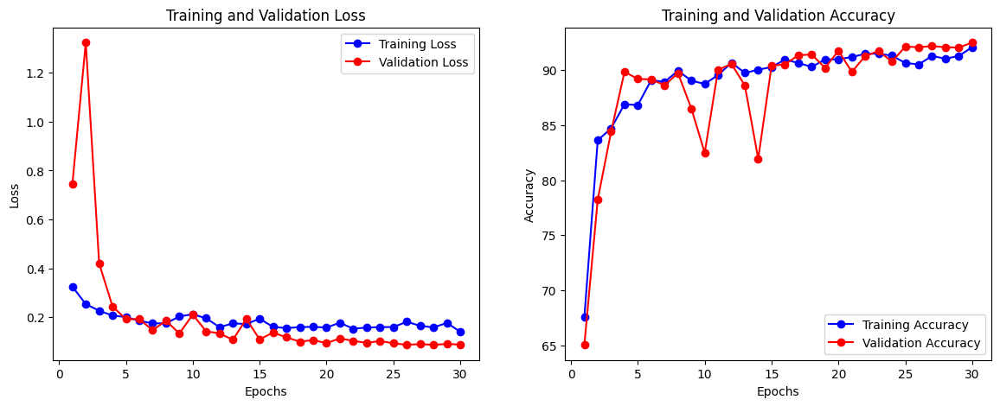

In [8]:
plot_training_history(history)

In [9]:
history

{'train_loss': [0.32549725122311535,
  0.25392091712530923,
  0.22703581785454469,
  0.20711532322799459,
  0.20120535527958588,
  0.18567640509675531,
  0.175207562306348,
  0.17543947433724122,
  0.20347587588955374,
  0.2125812514739878,
  0.1959229869877591,
  0.15985545033917709,
  0.17502880622358882,
  0.1726766609970261,
  0.1940392505596666,
  0.16098851009326823,
  0.15571834190803416,
  0.159942168961553,
  0.16093316016828313,
  0.1582506009761025,
  0.17771015535382664,
  0.15328267567297993,
  0.15805059276959477,
  0.1599247100598672,
  0.16018175815834718,
  0.18177744527073467,
  0.16527066248304703,
  0.1584972818108166,
  0.17717608283547795,
  0.1408486594172085],
 'val_loss': [0.7455646693706512,
  1.3237587660551071,
  0.420241542160511,
  0.24487555027008057,
  0.19247062504291534,
  0.19270851463079453,
  0.1473834440112114,
  0.18597519397735596,
  0.13396597281098366,
  0.21112710237503052,
  0.1427966132760048,
  0.1342742182314396,
  0.10789001733064651,
  0

In [23]:
torch.save(optimizer.state_dict(), './models_weights/deeplab_finetuned/deeplabv3_resnet50_optimizer.pth')

### Evaluation

C:\Users\001\AppData\Local\Temp\ipykernel_29656\3715671390.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_deeplabv3_resnet50_model = torch.load('./models_weights/d

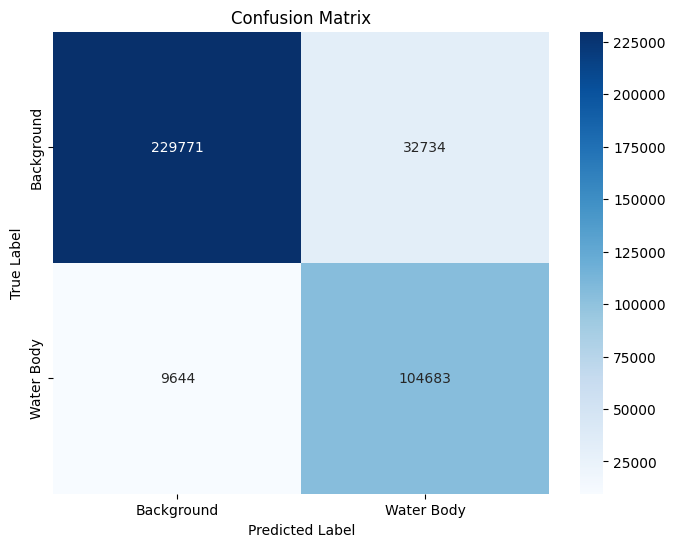

Classification Report:
              precision    recall  f1-score   support

  Background       0.96      0.88      0.92    262505
  Water Body       0.76      0.92      0.83    114327

    accuracy                           0.89    376832
   macro avg       0.86      0.90      0.87    376832
weighted avg       0.90      0.89      0.89    376832

Average Loss: 0.1180
Accuracy: 88.7541
Precision: 0.8997
Recall: 0.8875
F1 Score: 0.8901
Dice Coefficient: 0.8317
Intersection over Union: 0.7118


In [11]:
best_deeplabv3_resnet50_model = torch.load('./models_weights/deeplab_finetuned/deeplabv3_resnet50.pth')
test_metrics = evaluate(
    model=best_deeplabv3_resnet50_model,
    dataloader=test_loader,
    device=device,
    criterion=criterion,
    class_names=['Background', 'Water Body'],
    is_testing=True
)

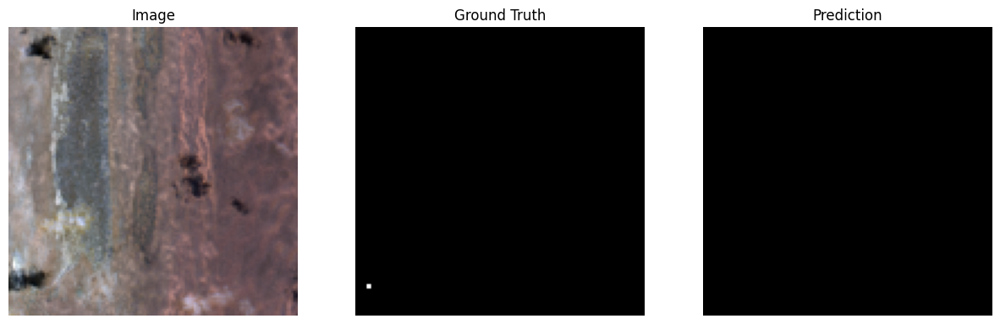

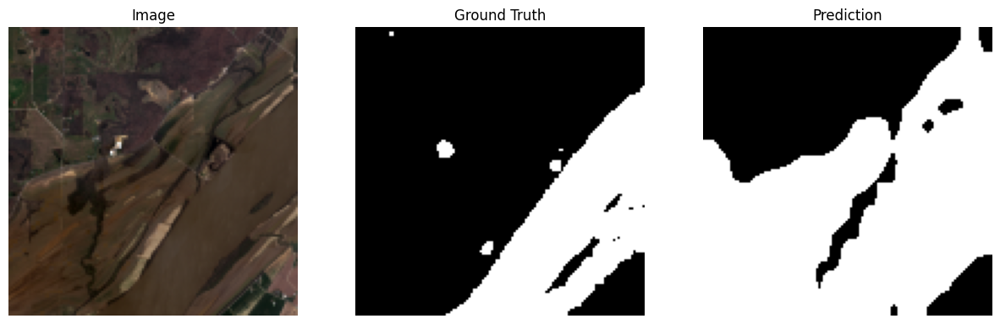

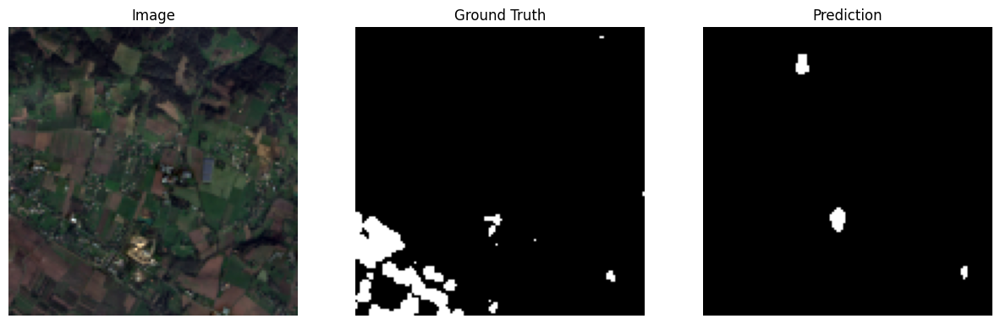

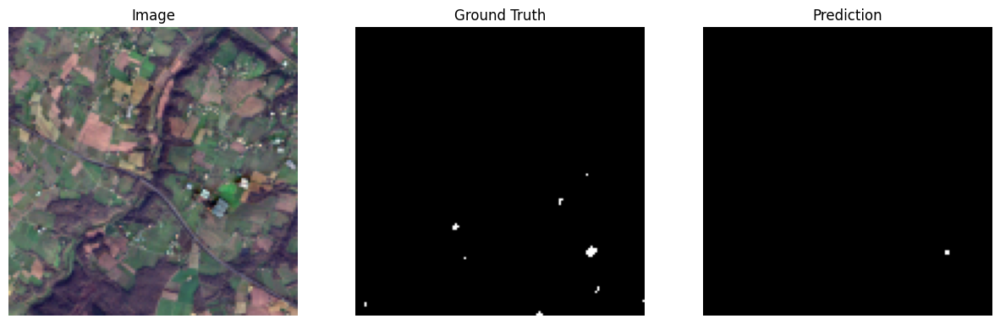

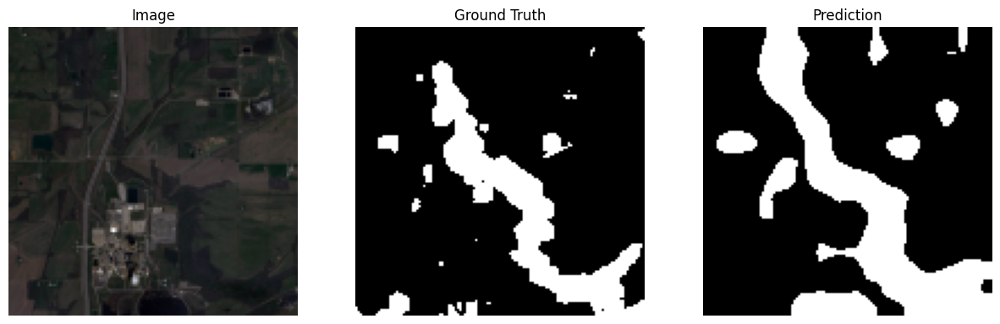

...

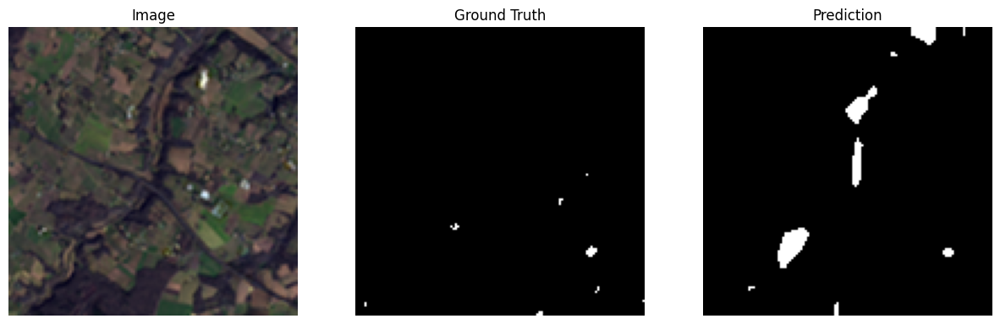

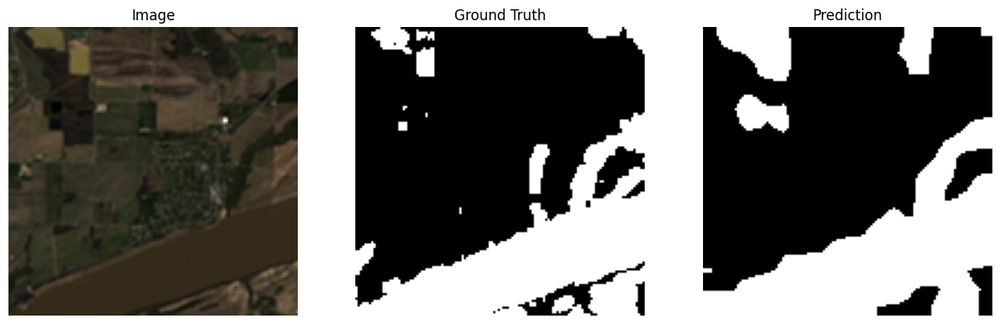

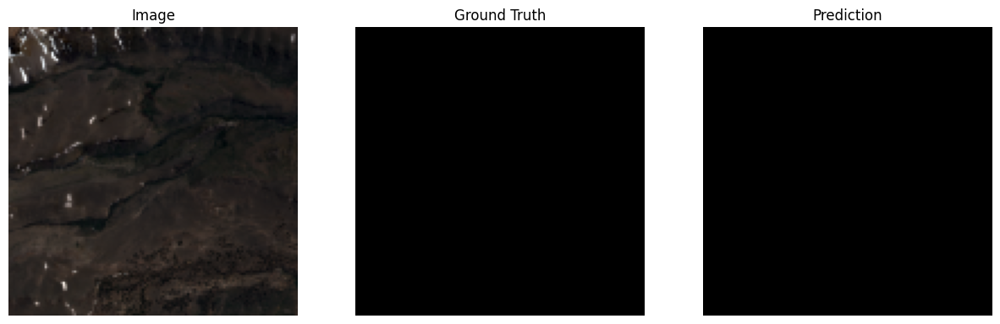

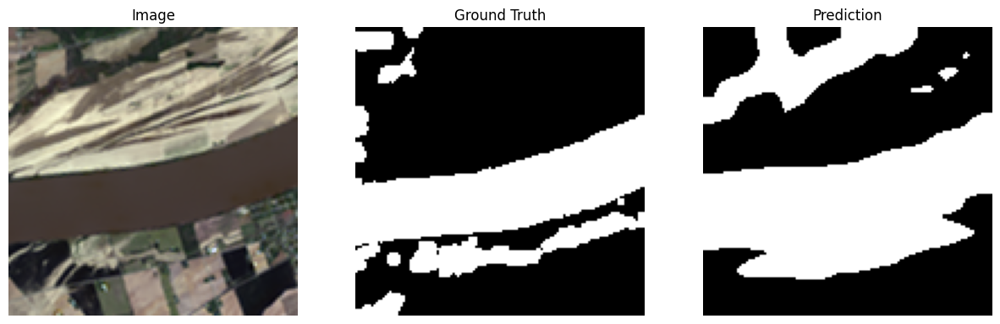

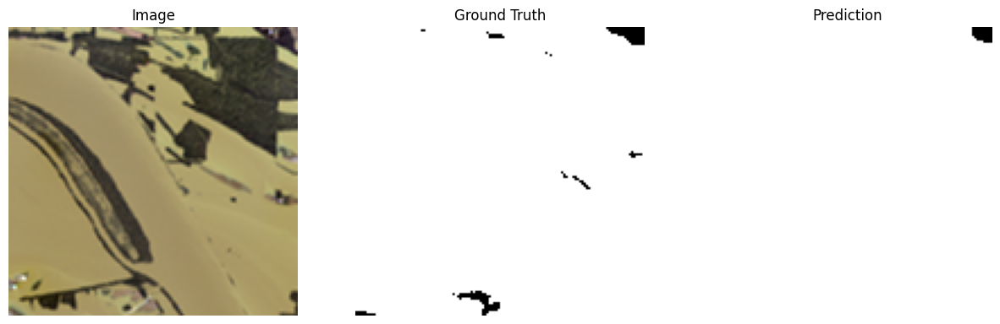

In [16]:
visualize_predictions(
    model=best_deeplabv3_resnet50_model,
    test_dataset=test_dataset,
    num_images=len(test_dataset),
)

https://www.kaggle.com/code/balraj98/deeplabv3-resnet101-for-segmentation-pytorch#Training-DeepLabV3+-with-Pretrained-ResNet101-Encoder

## UNet

In [27]:
from segmentation_models_pytorch import Unet
unet_model = Unet(encoder_name="resnet34", encoder_weights="imagenet", in_channels=12, classes=1)

In [22]:
from torchsummary import summary
summary(unet_model, input_size=(12, 512, 512), device='cpu')

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]          37,632
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
         MaxPool2d-4         [-1, 64, 128, 128]               0
            Conv2d-5         [-1, 64, 128, 128]          36,864
       BatchNorm2d-6         [-1, 64, 128, 128]             128
              ReLU-7         [-1, 64, 128, 128]               0
            Conv2d-8         [-1, 64, 128, 128]          36,864
       BatchNorm2d-9         [-1, 64, 128, 128]             128
             ReLU-10         [-1, 64, 128, 128]               0
       BasicBlock-11         [-1, 64, 128, 128]               0
           Conv2d-12         [-1, 64, 128, 128]          36,864
      BatchNorm2d-13         [-1, 64, 128, 128]             128
             ReLU-14         [-1, 64, 1

In [28]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
optimizer = torch.optim.Adam(unet_model.parameters(), lr=0.001)
dice_loss_kwargs = {
    'smooth': 1e-6,
}
focal_loss_kwargs = {
    'alpha': [0.25, 0.75],
    'gamma': 2,
    'reduction': 'mean',
}
num_epochs = 30
criterion = CombinedLoss(dice_loss_weight=0.5, focal_loss_weight=0.5, dice_loss_kwargs=dice_loss_kwargs,focal_loss_kwargs=focal_loss_kwargs)


In [29]:
history = train(
    model=unet_model,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    device=device,
    models_weights_path='./models_weights/unet_finetuned/unet.pth'
)

Epoch 1/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.40it/s]


Train Loss: 0.2935, Accuracy: 76.15%, Precision: 0.8187, Recall: 0.7615, F1 Score: 0.7777, Dice Coefficient: 0.5819, IOU: 0.4104


100%|██████████| 2/2 [00:02<00:00,  1.02s/it]


Val Loss: 2.9865, Accuracy: 73.17%, Precision: 0.8289, Recall: 0.7317, F1 Score: 0.7334, Dice Coefficient: 0.7246, IOU: 0.5681
--------------------------------------------------
Best model saved with Val Loss: 2.9865
Epoch 2/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.27it/s]


Train Loss: 0.2363, Accuracy: 85.95%, Precision: 0.8729, Recall: 0.8595, F1 Score: 0.8641, Dice Coefficient: 0.7100, IOU: 0.5504


100%|██████████| 2/2 [00:02<00:00,  1.02s/it]


Val Loss: 0.2008, Accuracy: 85.37%, Precision: 0.8612, Recall: 0.8537, F1 Score: 0.8554, Dice Coefficient: 0.8115, IOU: 0.6828
--------------------------------------------------
Best model saved with Val Loss: 0.2008
Epoch 3/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.42it/s]


Train Loss: 0.2179, Accuracy: 88.90%, Precision: 0.8940, Recall: 0.8890, F1 Score: 0.8909, Dice Coefficient: 0.7607, IOU: 0.6138


100%|██████████| 2/2 [00:01<00:00,  1.02it/s]


Val Loss: 0.1419, Accuracy: 90.17%, Precision: 0.9014, Recall: 0.9017, F1 Score: 0.9015, Dice Coefficient: 0.8634, IOU: 0.7597
--------------------------------------------------
Best model saved with Val Loss: 0.1419
Epoch 4/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.63it/s]


Train Loss: 0.1957, Accuracy: 89.71%, Precision: 0.8968, Recall: 0.8971, F1 Score: 0.8969, Dice Coefficient: 0.7631, IOU: 0.6169


100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


Val Loss: 0.1418, Accuracy: 90.82%, Precision: 0.9081, Recall: 0.9082, F1 Score: 0.9074, Dice Coefficient: 0.8686, IOU: 0.7678
--------------------------------------------------
Best model saved with Val Loss: 0.1418
Epoch 5/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.69it/s]


Train Loss: 0.1884, Accuracy: 90.39%, Precision: 0.9025, Recall: 0.9039, F1 Score: 0.9031, Dice Coefficient: 0.7741, IOU: 0.6315


100%|██████████| 2/2 [00:02<00:00,  1.04s/it]


Val Loss: 0.1899, Accuracy: 83.38%, Precision: 0.8463, Recall: 0.8338, F1 Score: 0.8362, Dice Coefficient: 0.7910, IOU: 0.6542
--------------------------------------------------
Epoch 6/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.58it/s]


Train Loss: 0.1839, Accuracy: 90.35%, Precision: 0.9032, Recall: 0.9035, F1 Score: 0.9034, Dice Coefficient: 0.7831, IOU: 0.6435


100%|██████████| 2/2 [00:01<00:00,  1.00it/s]


Val Loss: 0.1505, Accuracy: 90.02%, Precision: 0.9001, Recall: 0.9002, F1 Score: 0.8991, Dice Coefficient: 0.8564, IOU: 0.7489
--------------------------------------------------
Epoch 7/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.73it/s]


Train Loss: 0.1875, Accuracy: 90.37%, Precision: 0.9027, Recall: 0.9037, F1 Score: 0.9031, Dice Coefficient: 0.7764, IOU: 0.6345


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1302, Accuracy: 90.25%, Precision: 0.9020, Recall: 0.9025, F1 Score: 0.9021, Dice Coefficient: 0.8639, IOU: 0.7605
--------------------------------------------------
Best model saved with Val Loss: 0.1302
Epoch 8/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.33it/s]


Train Loss: 0.1889, Accuracy: 90.64%, Precision: 0.9041, Recall: 0.9064, F1 Score: 0.9047, Dice Coefficient: 0.7801, IOU: 0.6394


100%|██████████| 2/2 [00:01<00:00,  1.04it/s]


Val Loss: 0.1132, Accuracy: 91.25%, Precision: 0.9122, Recall: 0.9125, F1 Score: 0.9120, Dice Coefficient: 0.8765, IOU: 0.7802
--------------------------------------------------
Best model saved with Val Loss: 0.1132
Epoch 9/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.40it/s]


Train Loss: 0.1804, Accuracy: 90.12%, Precision: 0.9028, Recall: 0.9012, F1 Score: 0.9019, Dice Coefficient: 0.7806, IOU: 0.6401


100%|██████████| 2/2 [00:02<00:00,  1.03s/it]


Val Loss: 0.1270, Accuracy: 90.98%, Precision: 0.9102, Recall: 0.9098, F1 Score: 0.9087, Dice Coefficient: 0.8696, IOU: 0.7692
--------------------------------------------------
Epoch 10/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.92it/s]


Train Loss: 0.1740, Accuracy: 90.36%, Precision: 0.9037, Recall: 0.9036, F1 Score: 0.9037, Dice Coefficient: 0.7834, IOU: 0.6439


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1227, Accuracy: 91.01%, Precision: 0.9103, Recall: 0.9101, F1 Score: 0.9091, Dice Coefficient: 0.8707, IOU: 0.7710
--------------------------------------------------
Epoch 11/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.43it/s]


Train Loss: 0.1643, Accuracy: 91.27%, Precision: 0.9119, Recall: 0.9127, F1 Score: 0.9123, Dice Coefficient: 0.8010, IOU: 0.6680


100%|██████████| 2/2 [00:01<00:00,  1.01it/s]


Val Loss: 0.1264, Accuracy: 90.81%, Precision: 0.9078, Recall: 0.9081, F1 Score: 0.9074, Dice Coefficient: 0.8694, IOU: 0.7689
--------------------------------------------------
Epoch 12/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.68it/s]


Train Loss: 0.1544, Accuracy: 91.23%, Precision: 0.9123, Recall: 0.9123, F1 Score: 0.9123, Dice Coefficient: 0.8013, IOU: 0.6685


100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


Val Loss: 0.1329, Accuracy: 89.66%, Precision: 0.8964, Recall: 0.8966, F1 Score: 0.8965, Dice Coefficient: 0.8570, IOU: 0.7498
--------------------------------------------------
Epoch 13/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.66it/s]


Train Loss: 0.1618, Accuracy: 91.47%, Precision: 0.9162, Recall: 0.9147, F1 Score: 0.9153, Dice Coefficient: 0.8091, IOU: 0.6794


100%|██████████| 2/2 [00:02<00:00,  1.00s/it]


Val Loss: 0.1381, Accuracy: 90.70%, Precision: 0.9072, Recall: 0.9070, F1 Score: 0.9059, Dice Coefficient: 0.8659, IOU: 0.7635
--------------------------------------------------
Epoch 14/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.46it/s]


Train Loss: 0.1560, Accuracy: 91.82%, Precision: 0.9172, Recall: 0.9182, F1 Score: 0.9176, Dice Coefficient: 0.8114, IOU: 0.6826


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1268, Accuracy: 91.04%, Precision: 0.9100, Recall: 0.9104, F1 Score: 0.9100, Dice Coefficient: 0.8745, IOU: 0.7771
--------------------------------------------------
Epoch 15/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.35it/s]


Train Loss: 0.1751, Accuracy: 90.95%, Precision: 0.9090, Recall: 0.9095, F1 Score: 0.9093, Dice Coefficient: 0.7939, IOU: 0.6582


100%|██████████| 2/2 [00:01<00:00,  1.02it/s]


Val Loss: 0.1240, Accuracy: 90.90%, Precision: 0.9086, Recall: 0.9090, F1 Score: 0.9086, Dice Coefficient: 0.8725, IOU: 0.7739
--------------------------------------------------
Epoch 16/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.56it/s]


Train Loss: 0.1685, Accuracy: 91.00%, Precision: 0.9112, Recall: 0.9100, F1 Score: 0.9105, Dice Coefficient: 0.7998, IOU: 0.6663


100%|██████████| 2/2 [00:01<00:00,  1.01it/s]


Val Loss: 0.1162, Accuracy: 90.72%, Precision: 0.9072, Recall: 0.9072, F1 Score: 0.9072, Dice Coefficient: 0.8726, IOU: 0.7740
--------------------------------------------------
Epoch 17/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.59it/s]


Train Loss: 0.1656, Accuracy: 90.78%, Precision: 0.9093, Recall: 0.9078, F1 Score: 0.9085, Dice Coefficient: 0.7947, IOU: 0.6594


100%|██████████| 2/2 [00:01<00:00,  1.00it/s]


Val Loss: 0.1324, Accuracy: 90.61%, Precision: 0.9066, Recall: 0.9061, F1 Score: 0.9048, Dice Coefficient: 0.8637, IOU: 0.7600
--------------------------------------------------
Epoch 18/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.44it/s]


Train Loss: 0.1511, Accuracy: 91.84%, Precision: 0.9174, Recall: 0.9184, F1 Score: 0.9178, Dice Coefficient: 0.8107, IOU: 0.6816


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1291, Accuracy: 90.48%, Precision: 0.9051, Recall: 0.9048, F1 Score: 0.9049, Dice Coefficient: 0.8701, IOU: 0.7700
--------------------------------------------------
Epoch 19/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.35it/s]


Train Loss: 0.1476, Accuracy: 91.75%, Precision: 0.9176, Recall: 0.9175, F1 Score: 0.9175, Dice Coefficient: 0.8143, IOU: 0.6867


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1111, Accuracy: 90.82%, Precision: 0.9084, Recall: 0.9082, F1 Score: 0.9083, Dice Coefficient: 0.8745, IOU: 0.7770
--------------------------------------------------
Best model saved with Val Loss: 0.1111
Epoch 20/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.71it/s]


Train Loss: 0.1510, Accuracy: 91.78%, Precision: 0.9179, Recall: 0.9178, F1 Score: 0.9179, Dice Coefficient: 0.8134, IOU: 0.6855


100%|██████████| 2/2 [00:02<00:00,  1.05s/it]


Val Loss: 0.1327, Accuracy: 89.74%, Precision: 0.8978, Recall: 0.8974, F1 Score: 0.8976, Dice Coefficient: 0.8601, IOU: 0.7545
--------------------------------------------------
Epoch 21/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.52it/s]


Train Loss: 0.1529, Accuracy: 91.89%, Precision: 0.9188, Recall: 0.9189, F1 Score: 0.9188, Dice Coefficient: 0.8152, IOU: 0.6880


100%|██████████| 2/2 [00:02<00:00,  1.03s/it]


Val Loss: 0.1254, Accuracy: 91.85%, Precision: 0.9185, Recall: 0.9185, F1 Score: 0.9178, Dice Coefficient: 0.8838, IOU: 0.7917
--------------------------------------------------
Epoch 22/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.22it/s]


Train Loss: 0.1556, Accuracy: 91.77%, Precision: 0.9182, Recall: 0.9177, F1 Score: 0.9179, Dice Coefficient: 0.8144, IOU: 0.6869


100%|██████████| 2/2 [00:02<00:00,  1.04s/it]


Val Loss: 0.1174, Accuracy: 91.31%, Precision: 0.9128, Recall: 0.9131, F1 Score: 0.9128, Dice Coefficient: 0.8784, IOU: 0.7831
--------------------------------------------------
Epoch 23/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.58it/s]


Train Loss: 0.1633, Accuracy: 91.07%, Precision: 0.9113, Recall: 0.9107, F1 Score: 0.9110, Dice Coefficient: 0.8006, IOU: 0.6675


100%|██████████| 2/2 [00:02<00:00,  1.01s/it]


Val Loss: 0.1460, Accuracy: 89.59%, Precision: 0.8954, Recall: 0.8959, F1 Score: 0.8955, Dice Coefficient: 0.8543, IOU: 0.7456
--------------------------------------------------
Epoch 24/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.44it/s]


Train Loss: 0.1482, Accuracy: 92.26%, Precision: 0.9218, Recall: 0.9226, F1 Score: 0.9222, Dice Coefficient: 0.8217, IOU: 0.6974


100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


Val Loss: 0.1432, Accuracy: 90.69%, Precision: 0.9066, Recall: 0.9069, F1 Score: 0.9067, Dice Coefficient: 0.8710, IOU: 0.7715
--------------------------------------------------
Epoch 25/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.26it/s]


Train Loss: 0.1642, Accuracy: 91.22%, Precision: 0.9150, Recall: 0.9122, F1 Score: 0.9133, Dice Coefficient: 0.8077, IOU: 0.6774


100%|██████████| 2/2 [00:01<00:00,  1.00it/s]


Val Loss: 0.1202, Accuracy: 90.68%, Precision: 0.9065, Recall: 0.9068, F1 Score: 0.9066, Dice Coefficient: 0.8705, IOU: 0.7708
--------------------------------------------------
Epoch 26/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.57it/s]


Train Loss: 0.1611, Accuracy: 91.49%, Precision: 0.9176, Recall: 0.9149, F1 Score: 0.9160, Dice Coefficient: 0.8137, IOU: 0.6859


100%|██████████| 2/2 [00:02<00:00,  1.03s/it]


Val Loss: 0.1233, Accuracy: 91.01%, Precision: 0.9104, Recall: 0.9101, F1 Score: 0.9102, Dice Coefficient: 0.8772, IOU: 0.7812
--------------------------------------------------
Epoch 27/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.72it/s]


Train Loss: 0.1616, Accuracy: 91.61%, Precision: 0.9145, Recall: 0.9161, F1 Score: 0.9150, Dice Coefficient: 0.8028, IOU: 0.6706


100%|██████████| 2/2 [00:01<00:00,  1.02it/s]


Val Loss: 0.1166, Accuracy: 91.12%, Precision: 0.9109, Recall: 0.9112, F1 Score: 0.9110, Dice Coefficient: 0.8767, IOU: 0.7805
--------------------------------------------------
Epoch 28/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.51it/s]


Train Loss: 0.1617, Accuracy: 91.29%, Precision: 0.9137, Recall: 0.9129, F1 Score: 0.9132, Dice Coefficient: 0.8050, IOU: 0.6737


100%|██████████| 2/2 [00:01<00:00,  1.01it/s]


Val Loss: 0.1143, Accuracy: 90.67%, Precision: 0.9064, Recall: 0.9067, F1 Score: 0.9065, Dice Coefficient: 0.8707, IOU: 0.7710
--------------------------------------------------
Epoch 29/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.36it/s]


Train Loss: 0.1443, Accuracy: 91.82%, Precision: 0.9205, Recall: 0.9182, F1 Score: 0.9191, Dice Coefficient: 0.8209, IOU: 0.6962


100%|██████████| 2/2 [00:01<00:00,  1.02it/s]


Val Loss: 0.1094, Accuracy: 90.90%, Precision: 0.9091, Recall: 0.9090, F1 Score: 0.9080, Dice Coefficient: 0.8690, IOU: 0.7684
--------------------------------------------------
Best model saved with Val Loss: 0.1094
Epoch 30/30
----------


100%|██████████| 17/17 [00:02<00:00,  6.35it/s]


Train Loss: 0.1558, Accuracy: 91.64%, Precision: 0.9157, Recall: 0.9164, F1 Score: 0.9160, Dice Coefficient: 0.8091, IOU: 0.6794


100%|██████████| 2/2 [00:01<00:00,  1.03it/s]


Val Loss: 0.1081, Accuracy: 91.38%, Precision: 0.9138, Recall: 0.9138, F1 Score: 0.9138, Dice Coefficient: 0.8814, IOU: 0.7879
--------------------------------------------------
Best model saved with Val Loss: 0.1081
Finished Training


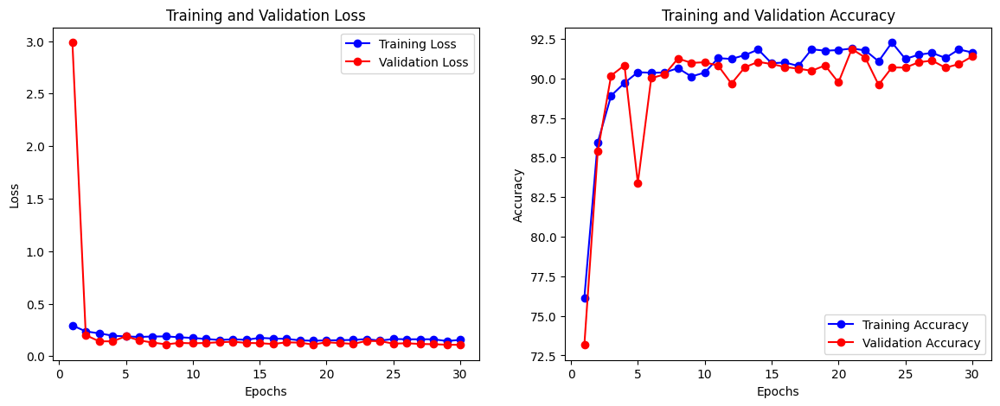

In [30]:
plot_training_history(history)

In [31]:
history

{'train_loss': [0.2934701398891561,
  0.23630153869881348,
  0.21792675028829014,
  0.19565094043226802,
  0.18843657304258907,
  0.18391521187389598,
  0.18753866237752578,
  0.18888527724672766,
  0.18042530732996323,
  0.1739687739926226,
  0.16426516631070306,
  0.15437595195630016,
  0.16179455860572703,
  0.15603937471614165,
  0.1750893886475002,
  0.16853192623923807,
  0.16563527110744924,
  0.15113144630894942,
  0.14761342283557444,
  0.15097523875096264,
  0.1528973325210459,
  0.1556047788437675,
  0.16325167215922298,
  0.1482122426523882,
  0.16419715127524206,
  0.16108372763675802,
  0.16159801272784963,
  0.16166094602907405,
  0.14429266444023917,
  0.1557880385833628],
 'val_loss': [2.986491858959198,
  0.20083004236221313,
  0.14191990345716476,
  0.14181111752986908,
  0.18985240161418915,
  0.15048301219940186,
  0.13020293414592743,
  0.11322716996073723,
  0.12703192979097366,
  0.12267948687076569,
  0.1263812631368637,
  0.13292564824223518,
  0.1381118707358

In [32]:
torch.save(optimizer.state_dict(), './models_weights/unet_finetuned/unet_optimizer.pth')

### Evaluation

C:\Users\001\AppData\Local\Temp\ipykernel_29656\352355817.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_unet_model = torch.load('./models_weights/unet_finetuned/u

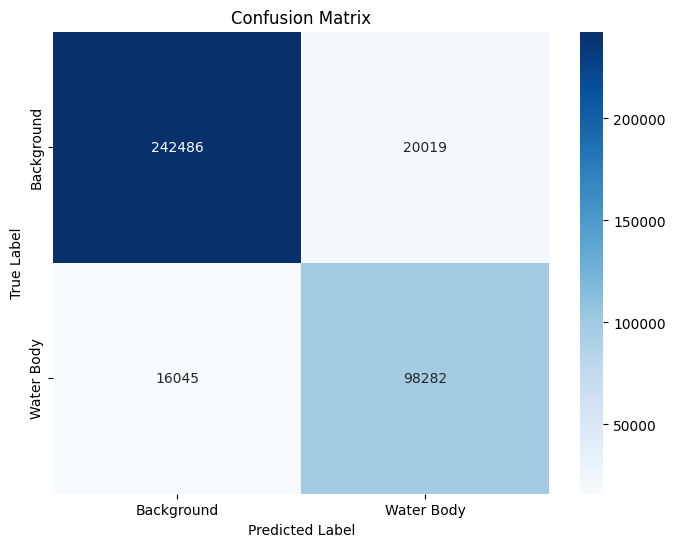

Classification Report:
              precision    recall  f1-score   support

  Background       0.94      0.92      0.93    262505
  Water Body       0.83      0.86      0.84    114327

    accuracy                           0.90    376832
   macro avg       0.88      0.89      0.89    376832
weighted avg       0.91      0.90      0.90    376832

Average Loss: 0.1171
Accuracy: 90.4297
Precision: 0.9054
Recall: 0.9043
F1 Score: 0.9047
Dice Coefficient: 0.8450
Intersection over Union: 0.7316


In [33]:
best_unet_model = torch.load('./models_weights/unet_finetuned/unet.pth')
unet_test_metrics = evaluate(
    model=best_unet_model,
    dataloader=test_loader,
    device=device,
    criterion=criterion,
    class_names=['Background', 'Water Body'],
    is_testing=True
)

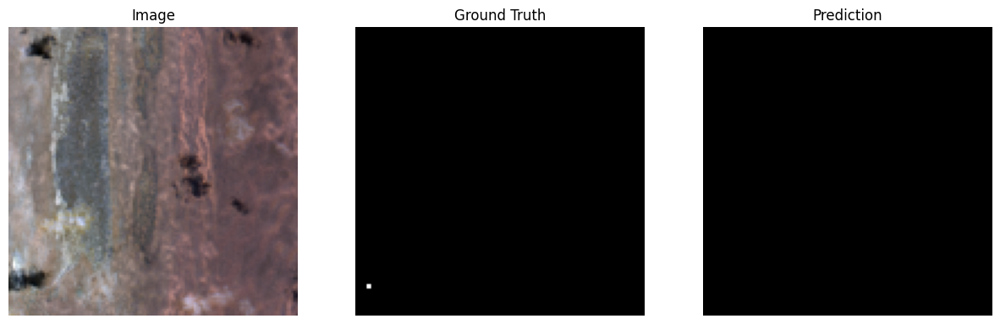

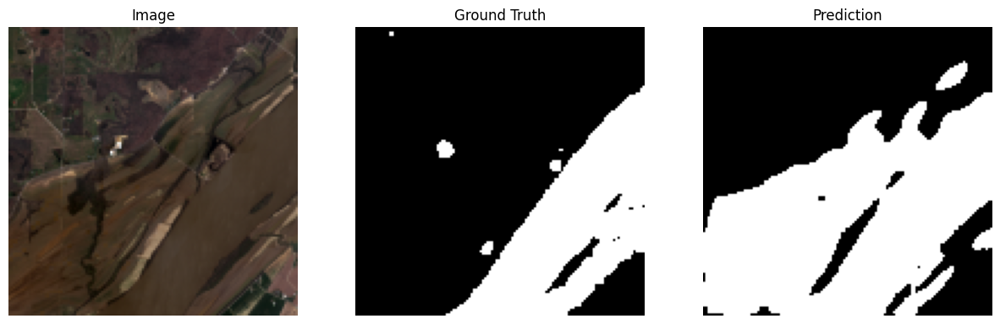

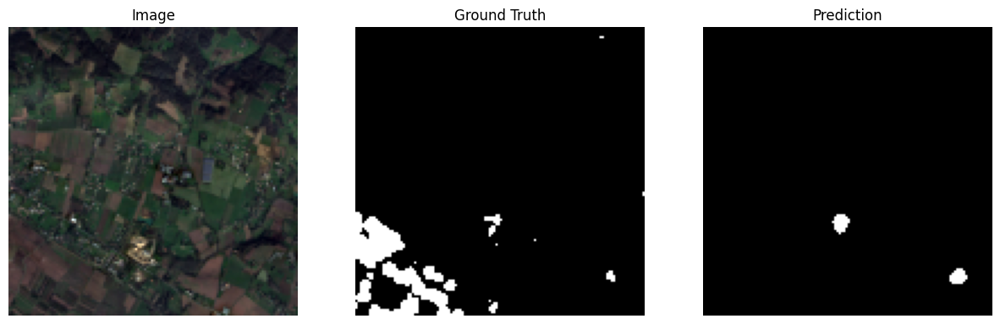

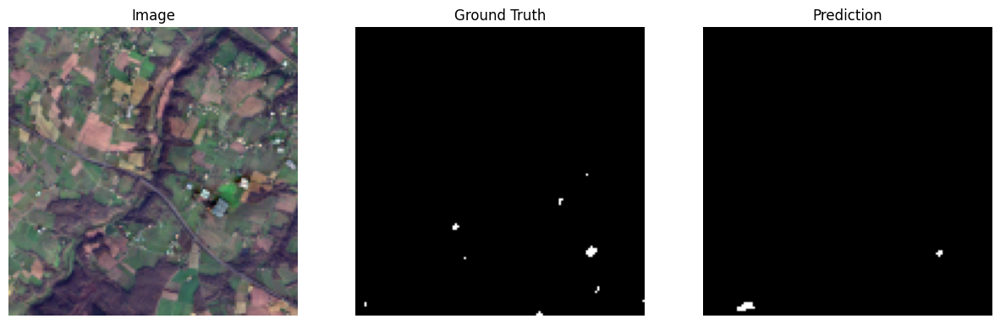

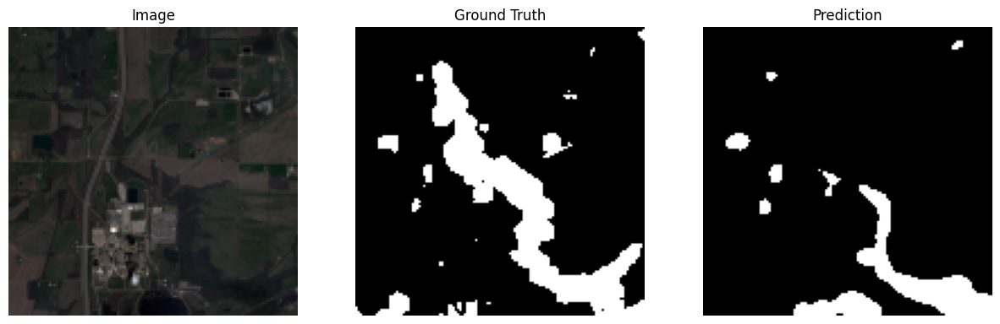

...

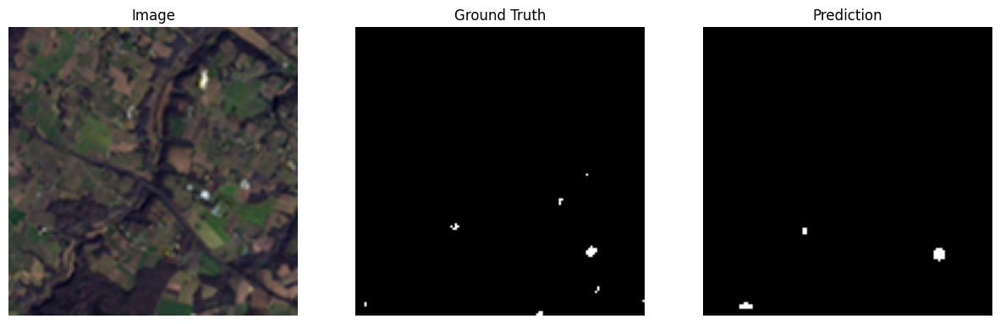

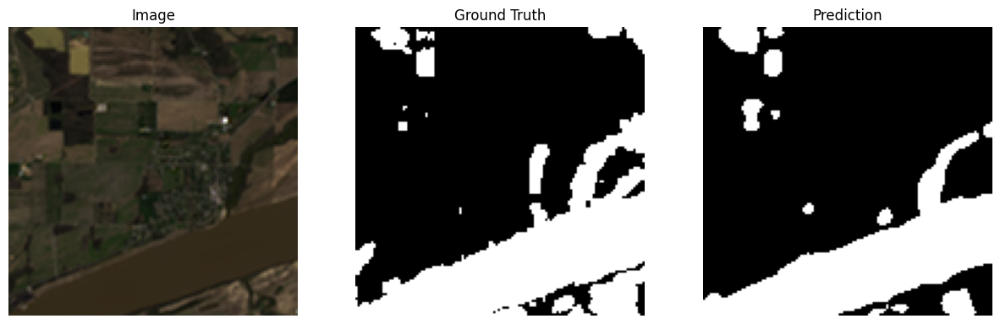

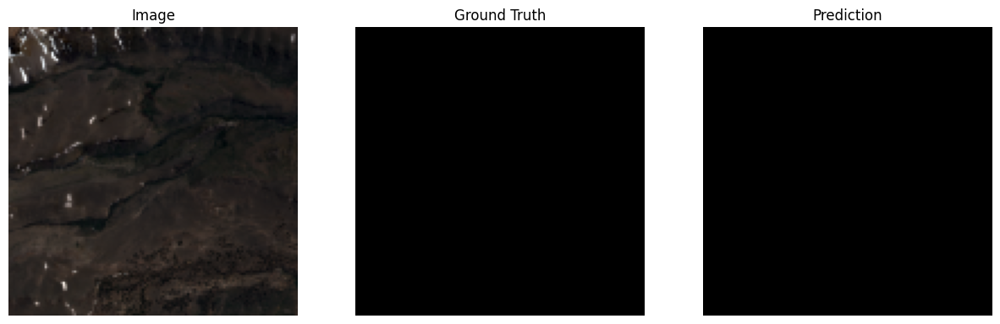

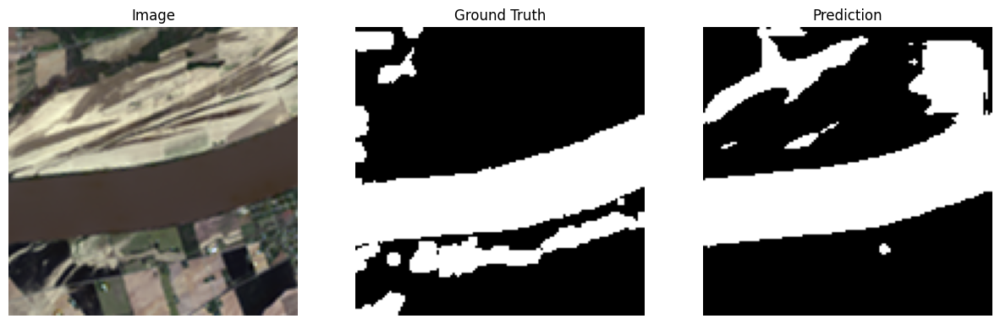

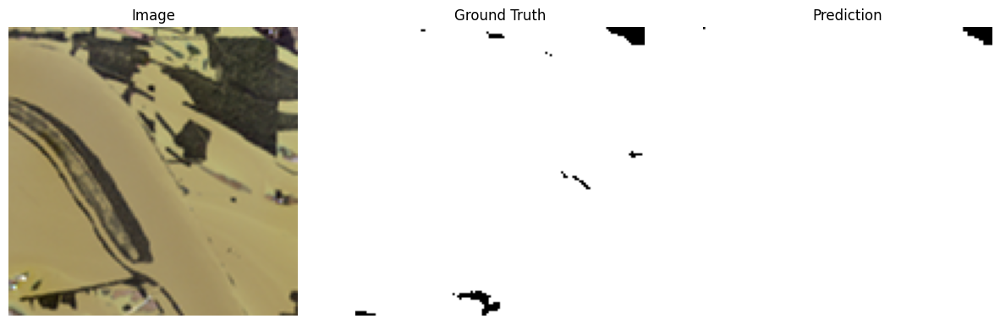

In [34]:
visualize_predictions(
    model=best_unet_model,
    test_dataset=test_dataset,
    num_images=len(test_dataset),
)